In [1]:
#!pip install -U git+https://github.com/albumentations-team/albumentations
#!pip install np_utils

# Pneumonia prediction - CNN - Deep Learning

---
#### Advancing Pneumonia Prediction with Deep Learning: Insights from CNN Architectures and Transfer Learning

**Notebook Autor:** Anderson Fuentes
**Asesor:** Dr. Orlando Iparraguirre

---

*En este notebook, exploramos y aplicamos técnicas avanzadas de Deep Learning, específicamente en el ámbito de las arquitecturas de Redes Neuronales Convolucionales (CNN) y el aprendizaje por transferencia, para mejorar la detección de neumonía. A lo largo del documento, discutiremos los detalles de nuestras implementaciones, los resultados obtenidos y las conclusiones clave.*

# Libraries

Este proyecto utiliza varias bibliotecas para el procesamiento de imágenes y el aprendizaje automático. A continuación, se presenta una descripción breve de cada una de ellas, su propósito en este proyecto, y los comandos para su instalación:

## Numpy
- **Descripción**: NumPy es una biblioteca para el lenguaje de programación Python, que añade soporte para vectores y matrices, junto con una gran colección de funciones matemáticas de alto nivel.
- **Uso en el Proyecto**: Utilizada para operaciones matemáticas y manipulación de arrays.
- **Instalación**: `!pip install numpy`

## Pandas
- **Descripción**: Pandas es una herramienta de manipulación y análisis de datos de código abierto rápida, potente, flexible y fácil de usar.
- **Uso en el Proyecto**: Utilizada para la manipulación y análisis de datos.
- **Instalación**: `!pip install pandas`

## Matplotlib
- **Descripción**: Matplotlib es una biblioteca de trazado para el lenguaje de programación Python y su extensión numérica matemática NumPy.
- **Uso en el Proyecto**: Utilizada para la visualización de datos y gráficos.
- **Instalación**: `!pip install matplotlib`

## OpenCV (cv2)
- **Descripción**: OpenCV (Open Source Computer Vision Library) es una biblioteca de software de visión por computadora y aprendizaje automático.
- **Uso en el Proyecto**: Utilizada para el procesamiento y manipulación de imágenes.
- **Instalación**: `!pip install opencv-python-headless` (para entornos sin interfaz gráfica)

## Plotly
- **Descripción**: Plotly es una biblioteca gráfica interactiva para Python.
- **Uso en el Proyecto**: Utilizada para crear gráficos interactivos.
- **Instalación**: `!pip install plotly`

## TensorFlow
- **Descripción**: TensorFlow es una biblioteca de software de código abierto para aprendizaje automático y redes neuronales.
- **Uso en el Proyecto**: Utilizada para construir y entrenar modelos de aprendizaje automático.
- **Instalación**: `!pip install tensorflow`

## Keras (parte de TensorFlow)
- **Descripción**: Keras es una interfaz para la biblioteca de aprendizaje automático TensorFlow.
- **Uso en el Proyecto**: Utilizada para construir y entrenar redes neuronales de manera sencilla.
- **Instalación**: Incluida con TensorFlow.

## MLxtend
- **Descripción**: MLxtend (machine learning extensions) es una biblioteca de extensiones y utilidades para programación científica y análisis de datos.
- **Uso en el Proyecto**: Utilizada para herramientas de visualización adicionales, como la matriz de confusión.
- **Instalación**: `!pip install mlxtend`

## Albumentations
- **Descripción**: Albumentations es una biblioteca rápida para aumento de imágenes.
- **Uso en el Proyecto**: Utilizada para aplicar transformaciones a imágenes, aumentando así la diversidad del conjunto de datos.
- **Instalación**: `!pip install albumentations`

## TQDM
- **Descripción**: TQDM es una biblioteca para barras de progreso en bucles en Python.
- **Uso en el Proyecto**: Utilizada para mostrar barras de progreso durante operaciones de larga duración.
- **Instalación**: `!pip install tqdm`

## Termcolor
- **Descripción**: Termcolor es una biblioteca para imprimir texto coloreado en la terminal.
- **Uso en el Proyecto**: Utilizada para resaltar mensajes importantes en la salida del terminal.
- **Instalación**: `!pip install termcolor`

## Scikit-learn
- **Descripción**: Scikit-learn es una biblioteca para aprendizaje automático en Python.
- **Uso en el Proyecto**: Utilizada para algoritmos de clasificación, regresión y clustering.
- **Instalación**: `!pip install scikit-learn`

Asegúrate de ejecutar los comandos de instalación en tu entorno virtual si es necesario.


In [1]:
%%time

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import cv2, os, random
import plotly
import plotly.graph_objs as go
import plotly.express as px
from plotly.offline import init_notebook_mode, plot, iplot

#____________________________________________________________

import glob
import tensorflow
from tensorflow.keras.preprocessing.image import array_to_img, img_to_array, load_img
from tensorflow.keras.layers import Conv2D, Flatten, MaxPooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from mlxtend.plotting import plot_confusion_matrix
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.applications.vgg16 import VGG16
from sklearn.model_selection import train_test_split

#____________________________________________________________

from tqdm.notebook import tqdm
from termcolor import colored
import albumentations as A

#____________________________________________________________

from warnings import filterwarnings
filterwarnings("ignore")

from sklearn import set_config
set_config(print_changed_only = False)
directory = "./chest_xray/"

#____________________________________________________________

print(colored("Required libraries were succesfully imported...", color = "green", attrs = ["bold", "dark"]))

Required libraries were succesfully imported...
CPU times: total: 3.59 s
Wall time: 59.1 s


### Check GPU

In [2]:
print(tensorflow.config.list_physical_devices("GPU"))

print("________________________________________________")

print(tensorflow.test.is_gpu_available(cuda_only = False, min_cuda_compute_capability = None))

[]
________________________________________________
Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
False


In [3]:
print("Current tensorflow version == {}".format(tensorflow. __version__))

Current tensorflow version == 2.14.0


In [4]:
%%time

train_df = glob.glob("./chest_xray/train/**/*.jpeg")
test_df = glob.glob("./chest_xray/test/**/*.jpeg")
validation_df = glob.glob("./chest_xray/val/**/*.jpeg")

print(colored("The datasets were succesfully loaded...", color = "green", attrs = ["bold", "dark"]))

The datasets were succesfully loaded...
CPU times: total: 46.9 ms
Wall time: 641 ms


#### Look at train and test sets

In [5]:
train_df[:5], test_df[:5]

(['./chest_xray/train\\NORMAL\\IM-0115-0001.jpeg',
  './chest_xray/train\\NORMAL\\IM-0117-0001.jpeg',
  './chest_xray/train\\NORMAL\\IM-0119-0001.jpeg',
  './chest_xray/train\\NORMAL\\IM-0122-0001.jpeg',
  './chest_xray/train\\NORMAL\\IM-0125-0001.jpeg'],
 ['./chest_xray/test\\NORMAL\\IM-0001-0001.jpeg',
  './chest_xray/test\\NORMAL\\IM-0003-0001.jpeg',
  './chest_xray/test\\NORMAL\\IM-0005-0001.jpeg',
  './chest_xray/test\\NORMAL\\IM-0006-0001.jpeg',
  './chest_xray/test\\NORMAL\\IM-0007-0001.jpeg'])

### Exploración de datos

#### ¿Cuántas imágenes hay en cada conjunto de datos?

In [6]:
print("There is {} images in the training dataset".format(len(train_df)))
print("There is {} images in the test dataset".format(len(test_df)))
print("There is {} images in the validation dataset".format(len(validation_df)))

There is 5216 images in the training dataset
There is 624 images in the test dataset
There is 16 images in the validation dataset


#### ¿Cuántas de las imágenes son de pulmones neumónicos y cuántas son de pulmones normales?

In [7]:
datasets, pneumonia_lung, normal_lung = ["train", "test", "val"], [], []

for i in datasets:
    path = os.path.join(directory, i)
    normal = glob.glob(os.path.join(path, "NORMAL/*.jpeg"))
    pneumonia = glob.glob(os.path.join(path, "PNEUMONIA/*.jpeg"))
    normal_lung.extend(normal), pneumonia_lung.extend(pneumonia)

print("The number of pneumonia images is {}".format(len(pneumonia_lung)))
print("The number of non-pneumonia images is {}".format(len(normal_lung)))

The number of pneumonia images is 4273
The number of non-pneumonia images is 1583


#### Mezclar las imágenes

In [8]:
random.shuffle(normal_lung)
random.shuffle(pneumonia_lung)
images = normal_lung[:50] + pneumonia_lung[:50]
images[:10]

['./chest_xray/train\\NORMAL\\IM-0700-0001.jpeg',
 './chest_xray/test\\NORMAL\\NORMAL2-IM-0374-0001-0001.jpeg',
 './chest_xray/train\\NORMAL\\IM-0693-0001.jpeg',
 './chest_xray/train\\NORMAL\\NORMAL2-IM-1184-0001.jpeg',
 './chest_xray/train\\NORMAL\\IM-0331-0001.jpeg',
 './chest_xray/train\\NORMAL\\IM-0435-0001-0001.jpeg',
 './chest_xray/train\\NORMAL\\IM-0652-0001-0002.jpeg',
 './chest_xray/train\\NORMAL\\NORMAL2-IM-0564-0001.jpeg',
 './chest_xray/train\\NORMAL\\IM-0319-0001.jpeg',
 './chest_xray/train\\NORMAL\\IM-0166-0001.jpeg']

#### Vista de imágenes en formato de rayos X.

<mark>Las imágenes de rayos X crean imágenes del interior de un cuerpo. Las imágenes muestran las partes de un cuerpo en diferentes tonalidades de blanco y negro. Esto se debe a que diferentes tejidos absorben diferentes cantidades de radiación. El calcio en los huesos es el que más absorbe los rayos X, por lo que los huesos se ven blancos</mark>

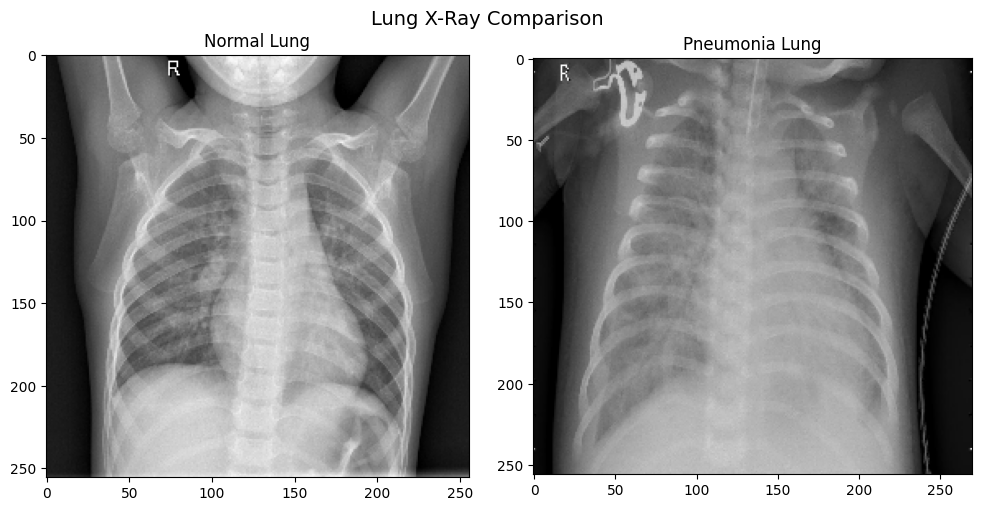

In [9]:
# Cargar y redimensionar las imágenes para que coincidan en tamaño
normal_img = load_img("./chest_xray/train/NORMAL/IM-0115-0001.jpeg", target_size=(256, 256))
pneumonia_img = load_img("./chest_xray/train/PNEUMONIA/person1000_bacteria_2931.jpeg", target_size=(256, 270))

# Configurar la figura
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
fig.suptitle('Lung X-Ray Comparison', fontsize=14)

# Mostrar la imagen de pulmón normal
axes[0].imshow(normal_img)
axes[0].set_title('Normal Lung', fontsize=12)
axes[0].axis('on')  # Asegurar que los ejes estén visibles

# Mostrar la imagen de pulmón con neumonía
axes[1].imshow(pneumonia_img)
axes[1].set_title('Pneumonia Lung', fontsize=12)
axes[1].axis('on')  # Asegurar que los ejes estén visibles

# Ajustar el layout
plt.tight_layout()
plt.show()

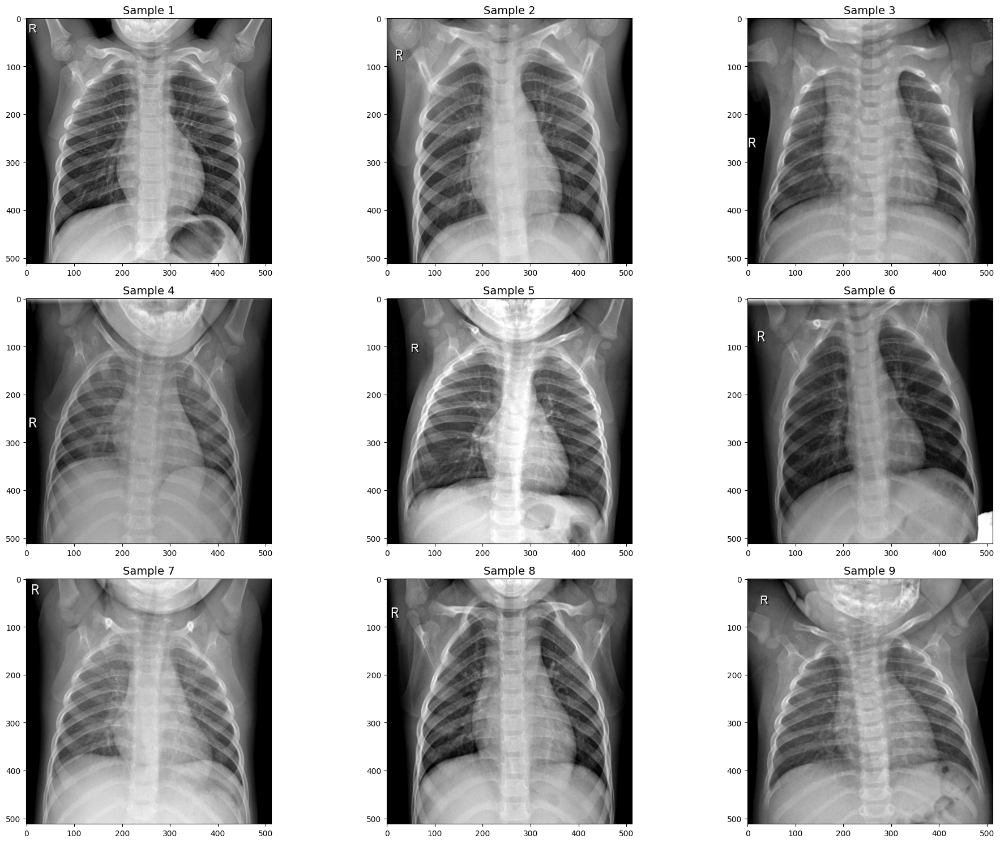

In [10]:
# Configurar la figura
fig = plt.figure(figsize=(20, 15))
columns, rows = 3, 3

# Recorrer y mostrar las imágenes
for i in range(1, 10):
    img = cv2.imread(images[i-1])  # Corregir índice para empezar desde 0
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convertir BGR a RGB
    img = cv2.resize(img, (512, 512))  # Redimensionar imagen

    ax = fig.add_subplot(rows, columns, i)
    ax.imshow(img)
    ax.set_title(f'Sample {i}', fontsize=14)  # Agregar título a cada imagen
    ax.axis('on')  # Mostrar ejes

plt.tight_layout()
plt.show()

#### Erosión de la imagen

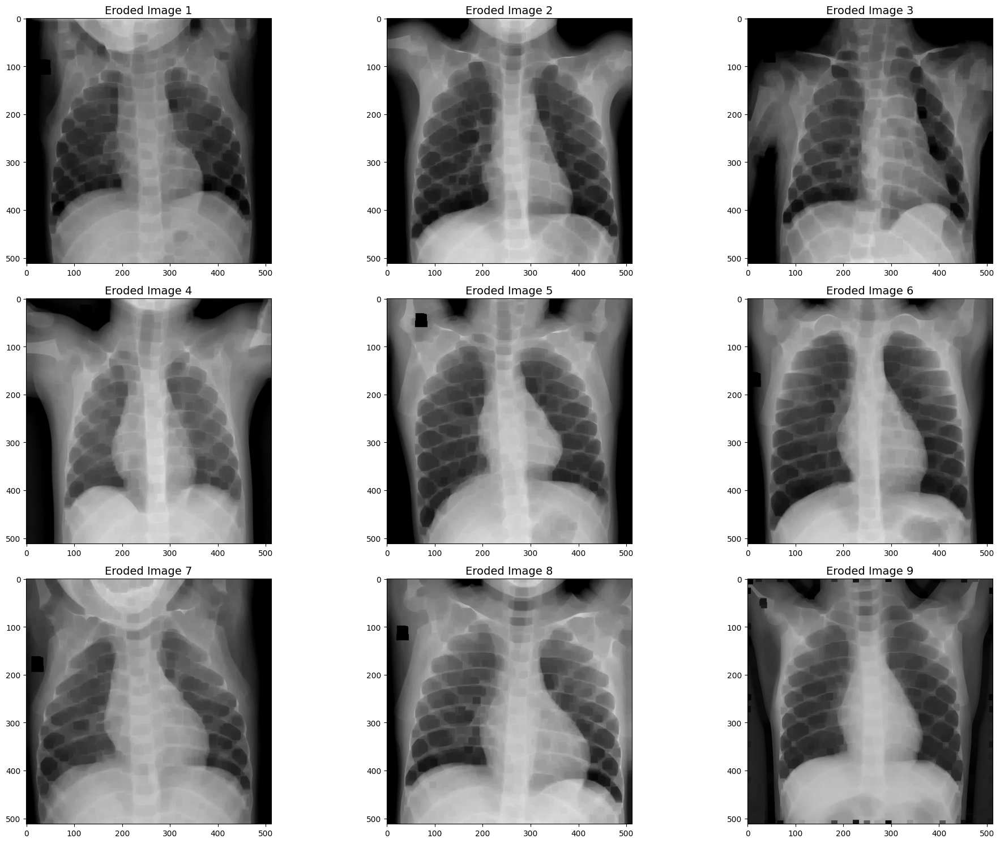

In [22]:
# Configurar la figura
fig = plt.figure(figsize=(20, 15))
columns, rows = 3, 3

# Recorrer y mostrar las imágenes procesadas
for i in range(1, 10):
    # Leer y procesar la imagen
    img = cv2.imread(images[i-1])  # Corregir índice para empezar desde 0
    img = cv2.resize(img, (512, 512))  # Redimensionar imagen
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convertir BGR a RGB

    # Aplicar erosión
    kernel = np.ones((5, 5), np.uint8)
    image_erosion = cv2.erode(img, kernel, iterations=3)

    # Mostrar la imagen
    ax = fig.add_subplot(rows, columns, i)
    ax.imshow(image_erosion)
    ax.set_title(f'Eroded Image {i}', fontsize=14)  # Título indicando erosión
    ax.axis('on')  # Mostrar ejes

plt.tight_layout()
plt.show()

#### Dilatación de la imagen

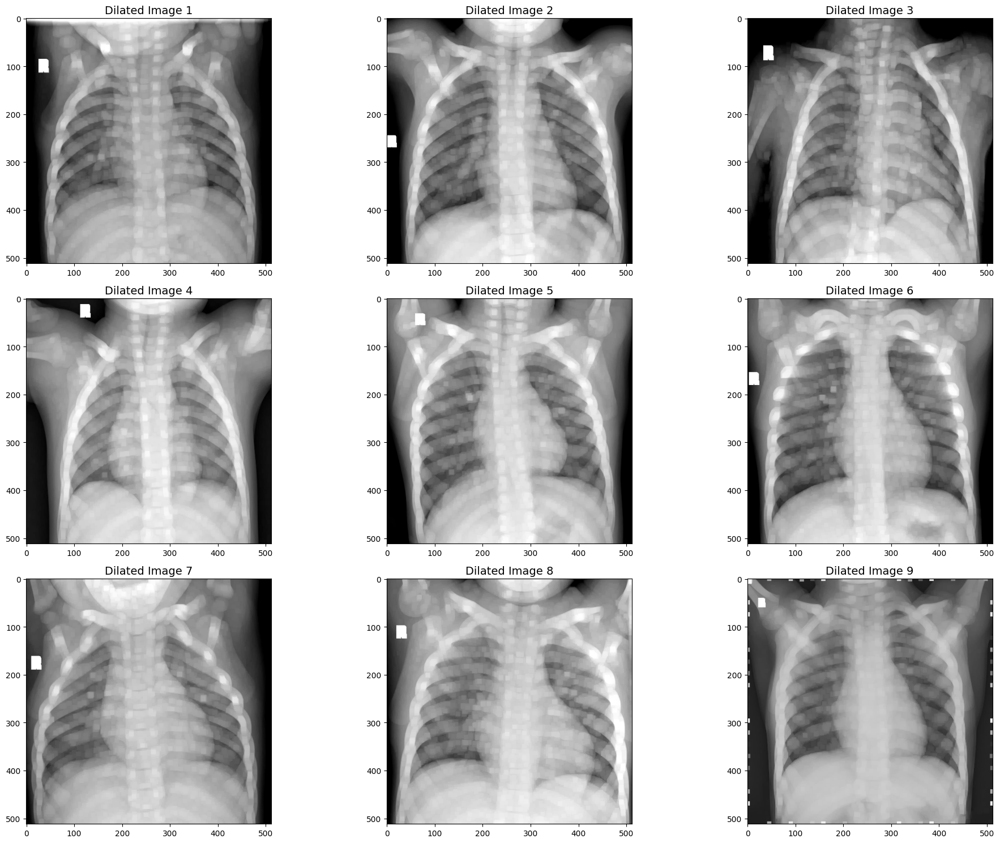

In [25]:
# Configurar la figura
fig = plt.figure(figsize=(20, 15))
columns, rows = 3, 3

# Recorrer y mostrar las imágenes procesadas
for i in range(1, 10):
    # Leer y procesar la imagen
    img = cv2.imread(images[i-1])  # Corregir índice para empezar desde 0
    img = cv2.resize(img, (512, 512))  # Redimensionar imagen
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convertir BGR a RGB

    # Aplicar dilatación
    kernel = np.ones((5, 5), np.uint8)
    image_dilation = cv2.dilate(img, kernel, iterations=2)

    # Mostrar la imagen
    ax = fig.add_subplot(rows, columns, i)
    ax.imshow(image_dilation)
    ax.set_title(f'Dilated Image {i}', fontsize=14)  # Título indicando dilatación
    ax.axis('on')  # Mostrar ejes

plt.tight_layout()
plt.show()

#### Conversión de imágenes a escala de grises y aplicación de desenfoque gaussiano.

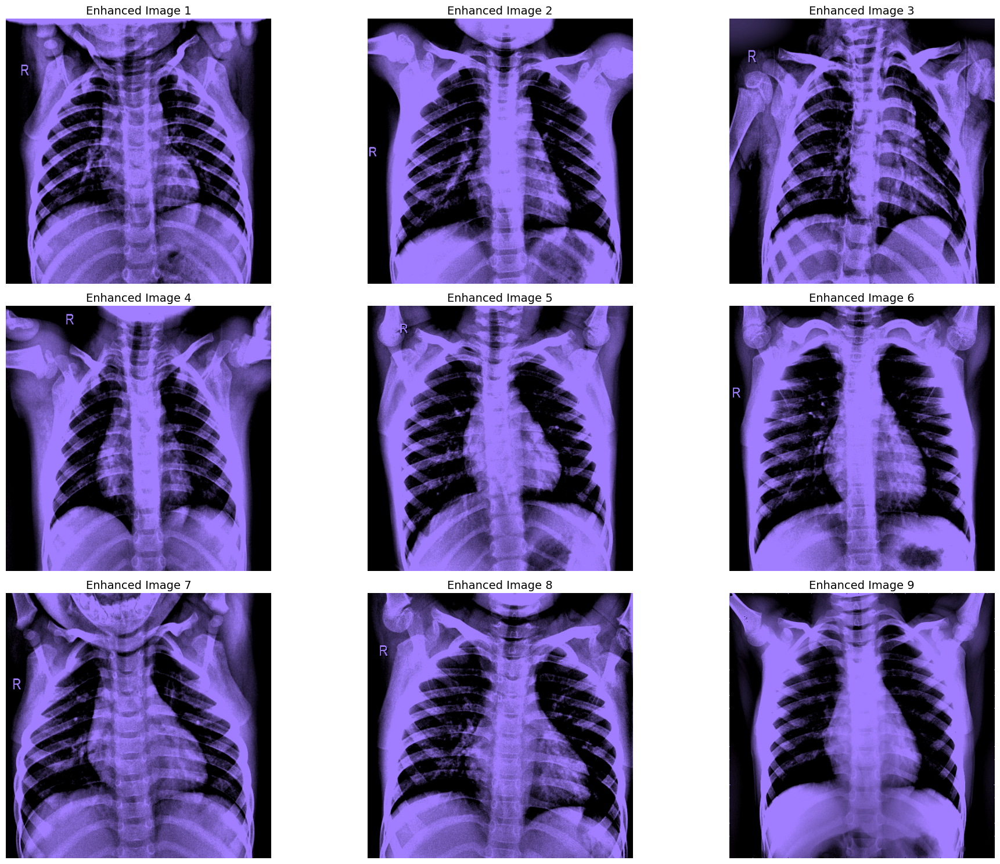

In [26]:
# Configurar la figura
fig = plt.figure(figsize=(20, 15))
columns, rows = 3, 3

# Recorrer y mostrar las imágenes procesadas
for i in range(1, 10):
    # Leer y procesar la imagen
    img = cv2.imread(images[i-1])  # Corregir índice para empezar desde 0
    img = cv2.resize(img, (512, 512))  # Redimensionar imagen
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)  # Convertir BGR a HSV

    # Aplicar el realce de contraste
    img = cv2.addWeighted(img, 4, cv2.GaussianBlur(img, (0, 0), 512/10), -4, 128)

    # Mostrar la imagen
    ax = fig.add_subplot(rows, columns, i)
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_HSV2RGB))  # Convertir HSV a RGB para mostrar
    ax.set_title(f'Enhanced Image {i}', fontsize=14)  # Título indicando la mejora
    ax.axis('off')  # Ocultar ejes

plt.tight_layout()
plt.show()

#### Detección de bordes astuta:

<mark>La detección de bordes Canny es una técnica para extraer información estructural útil de diferentes objetos de visión y reducir drásticamente la cantidad de datos a procesar. Se ha aplicado ampliamente en varios sistemas de visión por computadora.</mark>

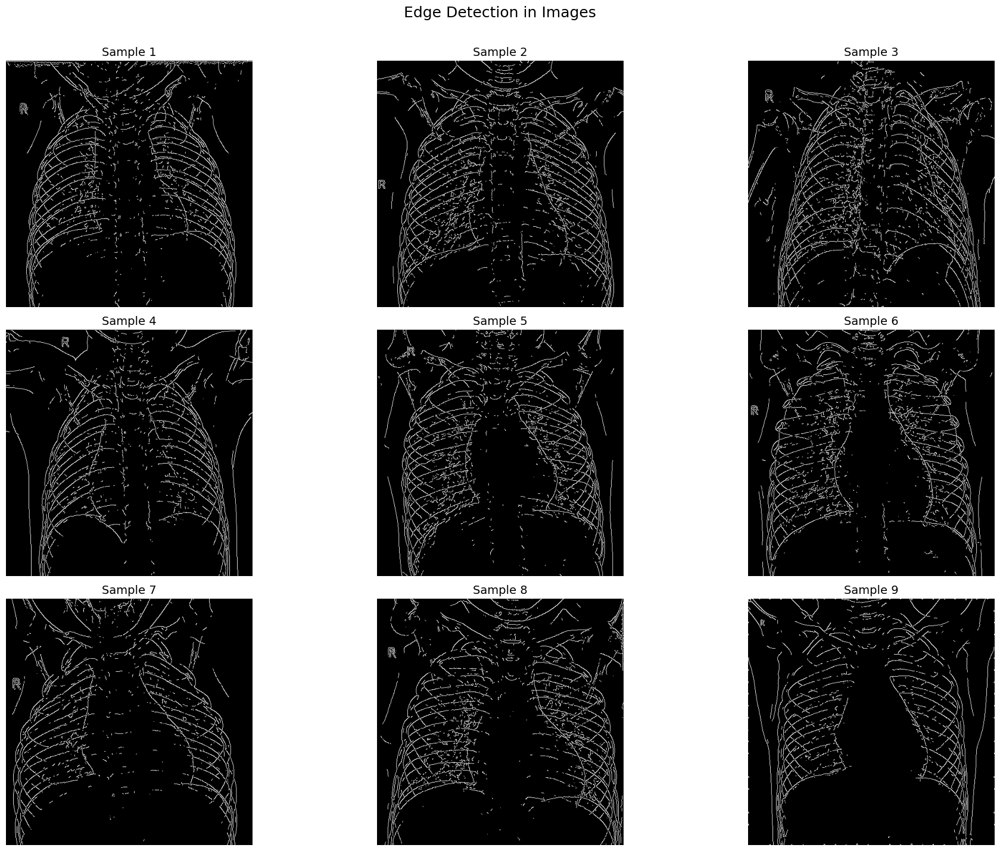

In [28]:
# Configurar la figura
fig, axes = plt.subplots(3, 3, figsize=(20, 15))
fig.suptitle("Edge Detection in Images", fontsize=18)

# Definir parámetros para la detección de bordes de Canny
low_threshold = 80
high_threshold = 100

# Recorrer y mostrar las imágenes procesadas
for i, ax in enumerate(axes.flatten(), start=1):
    if i > len(images):
        break  # Evitar error si hay menos de 9 imágenes

    # Leer y procesar la imagen
    img = cv2.imread(images[i-1], cv2.IMREAD_COLOR)
    img = cv2.resize(img, (512, 512))

    # Aplicar la detección de bordes de Canny
    detected_edges = cv2.Canny(img, low_threshold, high_threshold)

    # Mostrar la imagen
    ax.imshow(detected_edges, cmap='gray')
    ax.set_title(f'Sample {i}', fontsize=14)
    ax.axis('off')  # Ocultar ejes

# Ajustar espaciado
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

### Deep Learning Models

In [11]:
train_dir = "./chest_xray/train"
test_dir = "./chest_xray/test"
validation_dir = "./chest_xray/val"

In [12]:
%%time

train_datagen = ImageDataGenerator(
            rescale = 1/255.,
            horizontal_flip = True,
            vertical_flip = True,
            rotation_range = 0.3,
            zca_whitening = True,
            width_shift_range = 0.25,
            height_shift_range = 0.25,
            channel_shift_range = 0.35,
            shear_range = 0.2,
            zoom_range = 0.4)

val_test_datagen = ImageDataGenerator(rescale = 1./255)

train_set = train_datagen.flow_from_directory(train_dir, class_mode = "binary", batch_size = 16, target_size = (224, 224))
validation_set = val_test_datagen.flow_from_directory(validation_dir, class_mode = "binary", batch_size = 16, target_size = (224, 224))
test_set = val_test_datagen.flow_from_directory(test_dir, class_mode = "binary", batch_size = 16, target_size = (224, 224))

Found 5216 images belonging to 2 classes.
Found 16 images belonging to 2 classes.
Found 624 images belonging to 2 classes.
CPU times: total: 93.8 ms
Wall time: 1.06 s


#### Caché y captación previa de datos

If we use <mark>flow_from_directory along with ImageDataGenerator()</mark> to set up the dataset, it will not be compatible with <mark>tensorflow.data.AUTOTUNE.</mark> Use <mark>tensorflow.keras.preprocessing.image_dataset_from_directory</mark> instead to load the dataset.

In [19]:
'''
AUTOTUNE = tensorflow.data.experimental.AUTOTUNE

train_set = train_set.cache().prefetch(buffer_size = AUTOTUNE)
test_set = test_set.cache().prefetch(buffer_size = AUTOTUNE)
validation_set = validation_set.cache().prefetch(buffer_size = AUTOTUNE)
'''
pass

### Build CNN model

## ¿Qué es un algoritmo de red neuronal convolucional?

Una red neuronal convolucional (ConvNet / Redes neuronales convolucionales - CNN) es un algoritmo de aprendizaje profundo que puede tomar una imagen de entrada y separar varios aspectos/objetos en la imagen. La CNN es una arquitectura de red para el aprendizaje profundo que aprende directamente de los datos. Las CNN son particularmente útiles para encontrar patrones en imágenes para reconocer objetos, clases y categorías. También pueden ser bastante efectivas para clasificar audio, series temporales y datos de señales.

![](https://miro.medium.com/max/1400/1*uAeANQIOQPqWZnnuH-VEyw.jpeg)


## Capa convolucional

Una capa convolucional es el bloque principal de construcción de una CNN. Contiene un conjunto de filtros (o núcleos) cuyos parámetros se aprenderán durante el entrenamiento. El tamaño de los filtros suele ser menor que la imagen real. Cada filtro se entrelaza con la imagen y crea un mapa de activación.

![](https://miro.medium.com/max/1400/1*D6iRfzDkz-sEzyjYoVZ73w.gif)


## Paso (Stride) convolucional

El paso es un parámetro del filtro de la red neuronal que modifica la cantidad de movimiento sobre la imagen o video.

![](https://csdl-images.ieeecomputer.org/trans/si/2020/04/figures/ko1ab-2961602.gif)


## Relleno (Padding) convolucional

El relleno es un término relevante para las redes neuronales convolucionales, ya que se refiere a la cantidad de píxeles agregados a una imagen cuando está siendo procesada por el núcleo de una CNN. Por ejemplo, si el relleno en una CNN se establece en cero, entonces cada valor de píxel que se agrega será de valor cero.

¿Qué significa relleno ='same'? En este caso, agregamos 'p' capas de relleno de tal manera que la imagen de salida tenga las mismas dimensiones que la imagen de entrada. Se llama "same" (igual) porque el tamaño de salida es el mismo que el tamaño de entrada (cuando el paso es 1). Usar 'same' asegura que el filtro se aplique a todos los elementos de la entrada. Normalmente, el relleno se establece en "SAME" (igual) durante el entrenamiento del modelo.

![](https://miro.medium.com/max/2000/1*WpOcRWlofm0Z0EDUTKefzg.gif)


## Capa de agrupamiento (Pooling)

El propósito de las capas de agrupamiento es reducir las dimensiones de la capa oculta combinando las salidas de los grupos de neuronas en la capa anterior en una única neurona en la siguiente capa.

![](https://nico-curti.github.io/NumPyNet/NumPyNet/images/maxpool.gif)

![](https://miro.medium.com/max/1400/1*fXxDBsJ96FKEtMOa9vNgjA.gif)

In [31]:
model1 = Sequential()

#convolutional neural networks - CNNs
model1.add(Conv2D(32, (3,3), strides = (1, 1),activation = "relu", padding = "same", input_shape = (224, 224, 3)))
model1.add(MaxPooling2D(pool_size = (2, 2)))
model1.add(Conv2D(64, (3,3), strides = (1, 1), padding = "same", activation = "relu"))
model1.add(MaxPooling2D(pool_size = (2, 2)))
model1.add(Dropout(0.2))
model1.add(Conv2D(128, (3,3), strides = (1, 1), padding = "same", activation = "relu"))
model1.add(MaxPooling2D(pool_size = (2, 2)))
model1.add(Conv2D(256, (3,3), strides = (1, 1), padding = "same", activation = "relu"))
model1.add(MaxPooling2D(pool_size = (2, 2)))
model1.add(Dropout(0.2))
model1.add(Flatten())

#fully connected layer
model1.add(Dense(128, activation = "relu"))
model1.add(Dense(64, activation = "relu"))
model1.add(Dense(32, activation = "relu"))
model1.add(Dense(1, activation = "sigmoid"))
model1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 56, 56, 64)        0         
 g2D)                                                            
                                                                 
 dropout (Dropout)           (None, 56, 56, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 128)       7

#### Compilar el modelo

In [32]:
model1.compile(optimizer = "rmsprop", loss = "binary_crossentropy", metrics = ["accuracy"])

#### Entrenar el modelo

In [33]:
%%time

early_stopping_callbacks = tensorflow.keras.callbacks.EarlyStopping(patience = 15,
                                                                    restore_best_weights = True,
                                                                    verbose = 1)

CPU times: total: 0 ns
Wall time: 0 ns


In [34]:
%%time

history = model1.fit_generator(train_set, epochs = 20,
                              validation_data = validation_set,
                              steps_per_epoch = 100,
                              callbacks = [early_stopping_callbacks])

Epoch 1/20
100/100 [==============================] - 94s 913ms/step - loss: 0.5683 - accuracy: 0.7344 - val_loss: 0.6673 - val_accuracy: 0.5000
Epoch 2/20
100/100 [==============================] - 92s 918ms/step - loss: 0.4669 - accuracy: 0.7619 - val_loss: 0.7231 - val_accuracy: 0.4375
Epoch 3/20
100/100 [==============================] - 91s 912ms/step - loss: 0.4030 - accuracy: 0.7912 - val_loss: 0.4467 - val_accuracy: 0.8750
Epoch 4/20
100/100 [==============================] - 91s 908ms/step - loss: 0.3928 - accuracy: 0.8244 - val_loss: 0.6261 - val_accuracy: 0.6250
Epoch 5/20
100/100 [==============================] - 88s 873ms/step - loss: 0.3607 - accuracy: 0.8369 - val_loss: 0.7037 - val_accuracy: 0.6250
Epoch 6/20
100/100 [==============================] - 88s 873ms/step - loss: 0.3533 - accuracy: 0.8406 - val_loss: 1.2903 - val_accuracy: 0.6250
Epoch 7/20
100/100 [==============================] - 86s 859ms/step - loss: 0.3376 - accuracy: 0.8494 - val_loss: 0.8516 - val_ac

In [35]:
model1.input, model1.output

(<KerasTensor: shape=(None, 224, 224, 3) dtype=float32 (created by layer 'conv2d_input')>,
 <KerasTensor: shape=(None, 1) dtype=float32 (created by layer 'dense_3')>)

### Visualización del rendimiento del modelo 1.

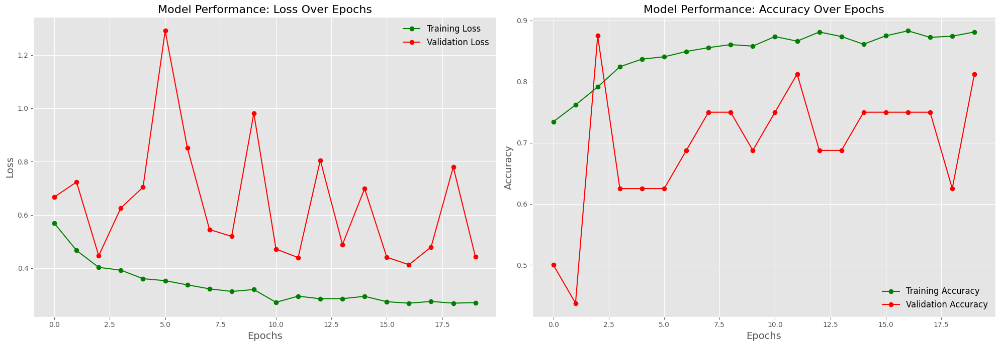

In [36]:
# Estableciendo un estilo más sofisticado
plt.style.use('ggplot')

# Crear una figura con dos subplots en una sola fila
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))

# Primer subplot: Loss
ax1.set_title("Model Performance: Loss Over Epochs", fontsize=16)
ax1.set_xlabel("Epochs", fontsize=14)
ax1.set_ylabel("Loss", fontsize=14)
ax1.plot(history.history['loss'], 'go-', label='Training Loss')
ax1.plot(history.history['val_loss'], 'ro-', label='Validation Loss')
ax1.legend(frameon=False, fontsize=12)
ax1.grid(True)

# Segundo subplot: Accuracy
ax2.set_title("Model Performance: Accuracy Over Epochs", fontsize=16)
ax2.set_xlabel("Epochs", fontsize=14)
ax2.set_ylabel("Accuracy", fontsize=14)
ax2.plot(history.history['accuracy'], 'go-', label='Training Accuracy')
ax2.plot(history.history['val_accuracy'], 'ro-', label='Validation Accuracy')
ax2.legend(frameon=False, fontsize=12)
ax2.grid(True)

# Mostrar la figura completa
plt.tight_layout()
plt.show()

### Evaluar el modelo 1 en el conjunto de prueba.

In [44]:
# Suponiendo que 'model1' y 'test_set' están definidos y son válidos
test_loss, test_accuracy = model1.evaluate(test_set, steps=50)

# Crear un DataFrame para mostrar los resultados
results = pd.DataFrame({
    'Metric': ['Accuracy', 'Loss'],
    'Value (%)': [test_accuracy * 100, test_loss * 100]
})

# Establecer la columna 'Metric' como índice para mejorar la visualización
results.set_index('Metric', inplace=True)

# Mostrar la tabla con un formato más profesional
print(results.to_string())

50/50 [==============================] - 11s 219ms/step - loss: 0.3620 - accuracy: 0.8413
          Value (%)
Metric             
Accuracy  84.134614
Loss      36.199009


## Aprendizaje por Transferencia (Transfer Learning)

El aprendizaje por transferencia es una técnica de aprendizaje automático donde un modelo desarrollado para una tarea se reutiliza como punto de inicio para un modelo en una segunda tarea. Es muy popular en el campo del aprendizaje profundo, donde modelos pre-entrenados son utilizados como el modelo inicial en problemas de visión por computadora y procesamiento de lenguaje natural.

![](https://slideplayer.com/slide/15398015/93/images/5/Transfer+Learning.jpg)

<a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#4A1810; font-family:sans-serif;color:#FFFFFF;font-size:130%;text-align:center">VGG16 model</p>

In [13]:
base_model1 = VGG16(include_top = False, weights = "imagenet", input_shape = (224, 224, 3), pooling = "max",
                    classes = 2)

#base_model1.load_weights("../input/vgg16/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5")
base_model1.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [42]:
model2 = Sequential()
model2.add(base_model1)
model2.add(Flatten())

model2.add(Dense(128, activation = "relu"))
model2.add(Dense(64, activation = "relu"))
model2.add(Dense(32, activation = "relu"))
model2.add(Dense(1, activation = "sigmoid"))

# freeze the layers
for layer in base_model1.layers:
    layer.trainable = False

model2.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["accuracy"])

In [43]:
%%time

history = model2.fit_generator(train_set, epochs = 20, validation_data = validation_set, steps_per_epoch = 100,
                               callbacks = [early_stopping_callbacks])

Epoch 1/20
100/100 [==============================] - 152s 2s/step - loss: 0.4541 - accuracy: 0.7800 - val_loss: 0.3896 - val_accuracy: 0.8125
Epoch 2/20
100/100 [==============================] - 156s 2s/step - loss: 0.3193 - accuracy: 0.8631 - val_loss: 0.4421 - val_accuracy: 0.7500
Epoch 3/20
100/100 [==============================] - 170s 2s/step - loss: 0.2892 - accuracy: 0.8763 - val_loss: 0.3744 - val_accuracy: 0.8125
Epoch 4/20
100/100 [==============================] - 159s 2s/step - loss: 0.3028 - accuracy: 0.8631 - val_loss: 0.4056 - val_accuracy: 0.6875
Epoch 5/20
100/100 [==============================] - 152s 2s/step - loss: 0.2777 - accuracy: 0.8800 - val_loss: 0.4002 - val_accuracy: 0.6875
Epoch 6/20
100/100 [==============================] - 152s 2s/step - loss: 0.2570 - accuracy: 0.8938 - val_loss: 0.3778 - val_accuracy: 0.8125
Epoch 7/20
100/100 [==============================] - 151s 2s/step - loss: 0.2393 - accuracy: 0.8919 - val_loss: 0.5655 - val_accuracy: 0.6875

### Visualización del rendimiento del modelo 2.

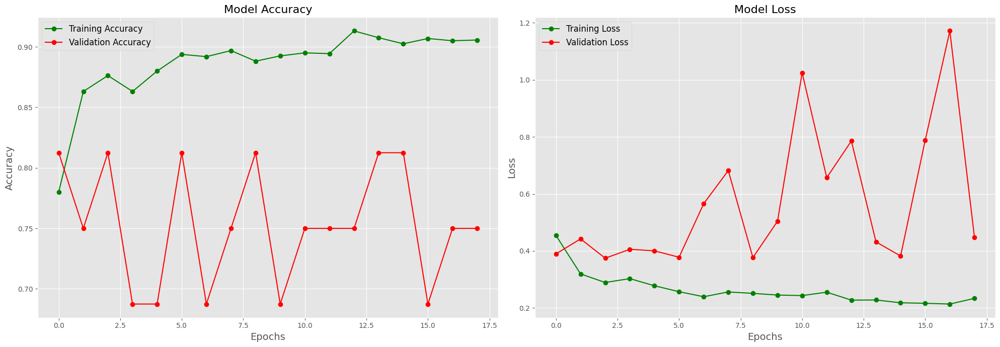

In [45]:
# Configurar una figura con dos subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))

# Gráfico de precisión (accuracy)
ax1.set_title("Model Accuracy", fontsize=16)
ax1.plot(history.history["accuracy"], "go-", label="Training Accuracy")
ax1.plot(history.history["val_accuracy"], "ro-", label="Validation Accuracy")
ax1.set_xlabel("Epochs", fontsize=14)
ax1.set_ylabel("Accuracy", fontsize=14)
ax1.legend(fontsize=12)
ax1.grid(True)

# Gráfico de pérdida (loss)
ax2.set_title("Model Loss", fontsize=16)
ax2.plot(history.history["loss"], "go-", label="Training Loss")
ax2.plot(history.history["val_loss"], "ro-", label="Validation Loss")
ax2.set_xlabel("Epochs", fontsize=14)
ax2.set_ylabel("Loss", fontsize=14)
ax2.legend(fontsize=12)
ax2.grid(True)

# Ajustar el layout
plt.tight_layout()
plt.show()

### Evaluar model 2 en el conjunto de prueba

In [48]:
# Suponiendo que 'model2' y 'test_set' están definidos y son válidos
test_loss, test_accuracy = model2.evaluate(test_set, steps=50)

# Crear un DataFrame para mostrar los resultados
results = pd.DataFrame({
    'Metric': ['Accuracy', 'Loss'],
    'Value': [test_accuracy * 100, test_loss * 100]
})

# Establecer la columna 'Metric' como índice para mejorar la visualización
results.set_index('Metric', inplace=True)

# Mostrar la tabla con un formato más profesional
print(results.to_string())

50/50 [==============================] - 60s 1s/step - loss: 0.5680 - accuracy: 0.6651
              Value
Metric             
Accuracy  66.506410
Loss      56.801748


<a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#4A1810; font-family:sans-serif;color:#FFFFFF;font-size:130%;text-align:center">ResNet50V2 model</p>

In [14]:
base_model2 = tensorflow.keras.applications.ResNet50V2(weights = "imagenet",
                                                       input_shape = (224, 224, 3),
                                                       pooling = "max", include_top = False,
                                                       classes = 2)

for layer in base_model2.layers:
    layer.trainable = False
    
base_model2.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 114, 114, 64)         0         ['conv1_conv[0][0]']          
                                                                                         

In [50]:
model3 = Sequential()
model3.add(base_model2)
model3.add(Flatten())

model3.add(Dense(128, activation = "relu"))
model3.add(Dense(64, activation = "relu"))
model3.add(Dense(32, activation = "relu"))
model3.add(Dense(1, activation = "sigmoid"))

# freeze the layers
for layer in base_model2.layers:
    layer.trainable = False

model3.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["accuracy"])

In [51]:
%%time

history = model3.fit_generator(train_set, epochs = 20, validation_data = validation_set, steps_per_epoch = 100,
                              callbacks = [early_stopping_callbacks])

Epoch 1/20
100/100 [==============================] - 95s 907ms/step - loss: 0.5004 - accuracy: 0.8225 - val_loss: 0.5963 - val_accuracy: 0.7500
Epoch 2/20
100/100 [==============================] - 81s 810ms/step - loss: 0.2664 - accuracy: 0.8888 - val_loss: 0.3488 - val_accuracy: 0.8750
Epoch 3/20
100/100 [==============================] - 73s 731ms/step - loss: 0.2280 - accuracy: 0.9000 - val_loss: 0.3292 - val_accuracy: 0.8125
Epoch 4/20
100/100 [==============================] - 73s 726ms/step - loss: 0.2294 - accuracy: 0.9087 - val_loss: 0.4423 - val_accuracy: 0.8750
Epoch 5/20
100/100 [==============================] - 73s 731ms/step - loss: 0.2107 - accuracy: 0.9187 - val_loss: 0.5085 - val_accuracy: 0.7500
Epoch 6/20
100/100 [==============================] - 73s 727ms/step - loss: 0.2347 - accuracy: 0.9131 - val_loss: 0.2971 - val_accuracy: 0.8750
Epoch 7/20
100/100 [==============================] - 76s 762ms/step - loss: 0.2217 - accuracy: 0.9050 - val_loss: 0.5343 - val_ac

### Visualización del rendimiento del modelo 3

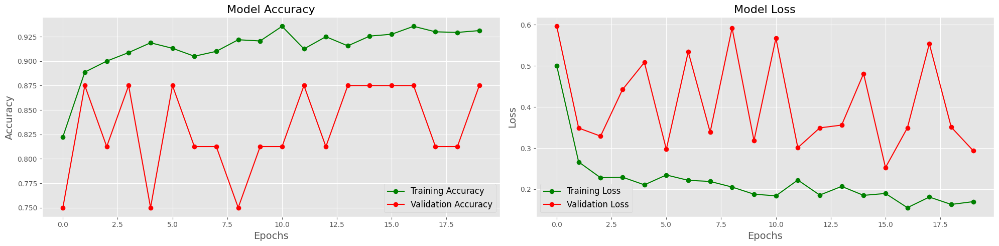

In [52]:
# Configurar una figura con dos subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 5))

# Gráfico de precisión (accuracy)
ax1.set_title("Model Accuracy", fontsize=16)
ax1.plot(history.history["accuracy"], "go-", label="Training Accuracy")
ax1.plot(history.history["val_accuracy"], "ro-", label="Validation Accuracy")
ax1.set_xlabel("Epochs", fontsize=14)
ax1.set_ylabel("Accuracy", fontsize=14)
ax1.legend(fontsize=12)
ax1.grid(True)

# Gráfico de pérdida (loss)
ax2.set_title("Model Loss", fontsize=16)
ax2.plot(history.history["loss"], "go-", label="Training Loss")
ax2.plot(history.history["val_loss"], "ro-", label="Validation Loss")
ax2.set_xlabel("Epochs", fontsize=14)
ax2.set_ylabel("Loss", fontsize=14)
ax2.legend(fontsize=12)
ax2.grid(True)

# Ajustar el layout para evitar superposición de elementos
plt.tight_layout()
plt.show()

### Evaluación del modelo 3 en el conjunto de prueba

In [54]:
# Suponiendo que 'model3' y 'test_set' están definidos y son válidos
test_loss, test_accuracy = model3.evaluate(test_set, steps=50)

# Crear un DataFrame para mostrar los resultados
results = pd.DataFrame({
    'Metric': ['Accuracy', 'Loss'],
    'Value (%)': [test_accuracy * 100, test_loss * 100]
})

# Establecer la columna 'Metric' como índice para mejorar la visualización
results.set_index('Metric', inplace=True)

# Mostrar la tabla con un formato más profesional
print(results.to_string())

50/50 [==============================] - 32s 631ms/step - loss: 0.2557 - accuracy: 0.9087
          Value (%)
Metric             
Accuracy  90.865386
Loss      25.567362


<a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#4A1810; font-family:sans-serif;color:#FFFFFF;font-size:130%;text-align:center;">Predicción de una nueva imagen</p>

1/1 [==============================] - 0s 99ms/step


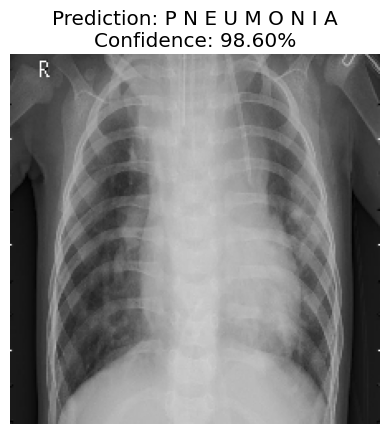

CPU times: total: 188 ms
Wall time: 249 ms


In [59]:
%%time

# Cargar y procesar la imagen
new_image_path = "./chest_xray/prediction/person103_bacteria_488.jpeg"
test_image = image.load_img(new_image_path, target_size=(224, 224))
test_image_processed = image.img_to_array(test_image)
test_image_processed = np.expand_dims(test_image_processed, axis=0)
test_image_processed = test_image_processed / 255

# Hacer la predicción
result = model3.predict(test_image_processed)
train_set.class_indices

# Interpretar la predicción
if result[0][0] == 0:
    prediction = "N O R M A L"
else:
    prediction = "P N E U M O N I A"

# Obtener la confianza de la predicción
confidence = np.max(result) * 100

# Mostrar la imagen junto con la predicción y la confianza
plt.imshow(test_image)
plt.title(f'Prediction: {prediction}\nConfidence: {confidence:.2f}%')
plt.axis('off')
plt.show()

### Guardar el modelo

In [60]:
model3.save("my_pneumonia_detection_model.h5")
print(colored("Model3 was succesfully saved to disk...", color = "green", attrs = ["bold", "dark"]))

Model3 was succesfully saved to disk...


### Algún tiempo después es posible que se necesite el modelo para usarlo.

In [61]:
model_loaded = tensorflow.keras.models.load_model("./my_pneumonia_detection_model.h5")
model_loaded.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
 flatten_2 (Flatten)         (None, 2048)              0         
                                                                 
 dense_8 (Dense)             (None, 128)               262272    
                                                                 
 dense_9 (Dense)             (None, 64)                8256      
                                                                 
 dense_10 (Dense)            (None, 32)                2080      
                                                                 
 dense_11 (Dense)            (None, 1)                 33        
                                                                 
Total params: 23837441 (90.93 MB)
Trainable params: 27

### Usar el modelo guardado para predecir una nueva imagen

1/1 [==============================] - 1s 1s/step


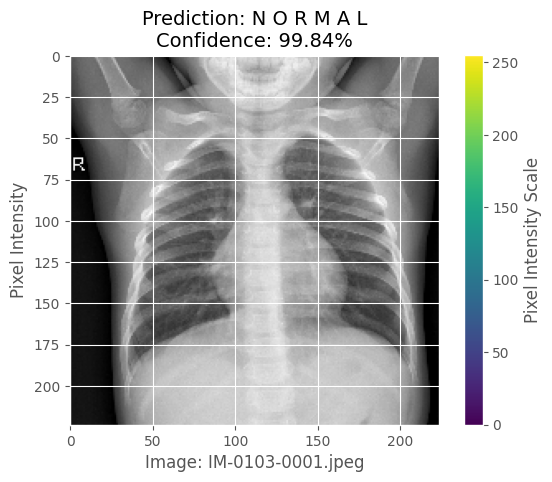

Diagnostic Prediction: N O R M A L
Confidence Level: 99.84%


In [69]:
from tensorflow.keras.preprocessing import image

def image_prediction(new_image_path):
    test_image = image.load_img(new_image_path, target_size=(224, 224))
    test_image = image.img_to_array(test_image)
    test_image = np.expand_dims(test_image, axis=0)
    test_image = test_image / 255.0

    model_loaded = tensorflow.keras.models.load_model("./my_pneumonia_detection_model.h5")
    prediction = model_loaded.predict(test_image)

    # Cargar la imagen para mostrar
    test_image_for_plotting = image.load_img(new_image_path, target_size=(224, 224))

    # Calcular la estadística y determinar la etiqueta
    if(prediction[0] > 0.5):
        statistic = prediction[0] * 100 
        label = "P N E U M O N I A"
    else:
        statistic = (1.0 - prediction[0]) * 100
        label = "N O R M A L"

    # Mostrar la imagen y la predicción
    plt.imshow(test_image_for_plotting)
    plt.title(f"Prediction: {label}\nConfidence: {statistic[0]:.2f}%", fontsize=14)
    plt.xlabel(f'Image: {new_image_path.split("/")[-1]}', fontsize=12)
    plt.ylabel('Pixel Intensity', fontsize=12)
    plt.colorbar(label='Pixel Intensity Scale')
    plt.axis('on')
    plt.show()

    # Imprimir un resumen de la predicción
    print(f"Diagnostic Prediction: {label}")
    print(f"Confidence Level: {statistic[0]:.2f}%")

# Llamar y usar la función
image_prediction("./chest_xray/prediction/IM-0103-0001.jpeg")

### Obtenga datos de prueba y etiquetas de prueba

In [70]:
test_dir = "./chest_xray/test"
test_data, test_labels = [], []

In [71]:
for i in ["/NORMAL/", "/PNEUMONIA/"]:
    for image in (os.listdir(test_dir + i)):
        image = plt.imread(test_dir + i + image)
        image = cv2.resize(image, (224, 224))
        image = np.dstack([image, image, image])
        image = image.astype("float32") / 255
        if i == "/NORMAL/":
            label = 0
        elif i == "/PNEUMONIA/":
            label = 1
        test_data.append(image)
        test_labels.append(label)

test_data = np.array(test_data)
test_labels = np.array(test_labels)

### Plot confusion matrix

20/20 [==============================] - 28s 1s/step


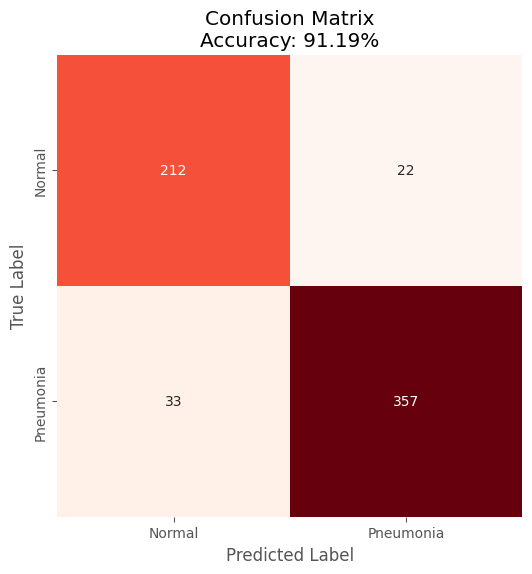

True Negatives (TN): 212
False Positives (FP): 22
False Negatives (FN): 33
True Positives (TP): 357
Accuracy: 91.19%


In [73]:
import seaborn as sns

# Suponiendo que model_loaded, test_data y test_labels están definidos y son válidos
predictions = model_loaded.predict(test_data)
conf_m = confusion_matrix(test_labels, np.round(predictions))
acc = accuracy_score(test_labels, np.round(predictions)) * 100
tn, fp, fn, tp = conf_m.ravel()

# Crear un gráfico de la matriz de confusión
plt.figure(figsize=(6, 6))
sns.heatmap(conf_m, annot=True, fmt="d", cmap=plt.cm.Reds, cbar=False)
plt.title(f"Confusion Matrix\nAccuracy: {acc:.2f}%")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(ticks=[0.5, 1.5], labels=["Normal", "Pneumonia"])
plt.yticks(ticks=[0.5, 1.5], labels=["Normal", "Pneumonia"])
plt.show()

# Reportar las métricas de la matriz de confusión
print(f"True Negatives (TN): {tn}")
print(f"False Positives (FP): {fp}")
print(f"False Negatives (FN): {fn}")
print(f"True Positives (TP): {tp}")
print(f"Accuracy: {acc:.2f}%")

### Obtener métricas de prueba

In [74]:
%%time

# Suponiendo que las variables tp, fp, fn, acc están definidas y son válidas
precision = tp / (tp + fp) * 100
recall = tp / (tp + fn) * 100
f1_score = 2 * precision * recall / (precision + recall)

# Crear un DataFrame para mostrar las métricas
metrics = pd.DataFrame({
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1-score'],
    'Value (%)': [acc, precision, recall, f1_score]
})

# Establecer la columna 'Metric' como índice para mejorar la visualización
metrics.set_index('Metric', inplace=True)

# Mostrar la tabla
print(metrics.to_string())

           Value (%)
Metric              
Accuracy   91.185897
Precision  94.195251
Recall     91.538462
F1-score   92.847854
CPU times: total: 0 ns
Wall time: 1.99 ms


## Mostremos clases predichas correctas e incorrectas.

In [77]:
predictions = list()
preds = model_loaded.predict(test_data)
for i in preds:
    if i >= 0.5:
        predictions.append(1)
    else:
        predictions.append(0)
predictions[:20]

20/20 [==============================] - 31s 2s/step


[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0]

<mark>np.nonzero() function se utiliza para calcular los índices de los elementos que son distintos de cero. <\mark> 

In [78]:
correct_predictions = np.nonzero(predictions == test_labels)[0]
incorrect_predictions = np.nonzero(predictions != test_labels)[0]

# let's look at indices of correct predictions
print("Indices of correct predictions:\n", correct_predictions[:15])

# let's look at indices of incorrect correct predictions
print("\nIndices of incorrect predictions:\n", incorrect_predictions[:15])

Indices of correct predictions:
 [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]

Indices of incorrect predictions:
 [ 16  45  67  94  95 119 121 122 123 124 126 129 131 132 133]


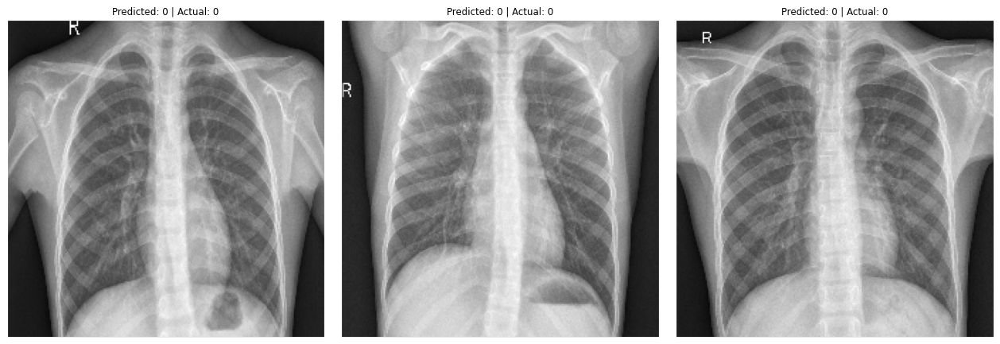

In [83]:
# display correct predictions

# Crear una figura para todas las subtramas
plt.figure(figsize=(15, 5), dpi=85)

# Mostrar las primeras 3 predicciones correctas en una sola fila
for i, a in enumerate(correct_predictions[:3]):
    ax = plt.subplot(1, 3, i + 1)
    ax.imshow(test_data[a].reshape(224, 224, 3))
    ax.set_title(f"Predicted: {predictions[a]} | Actual: {test_labels[a]}", fontsize=10)
    ax.set_xticks([]), ax.set_yticks([])  # Eliminar ejes

plt.tight_layout()
plt.show()

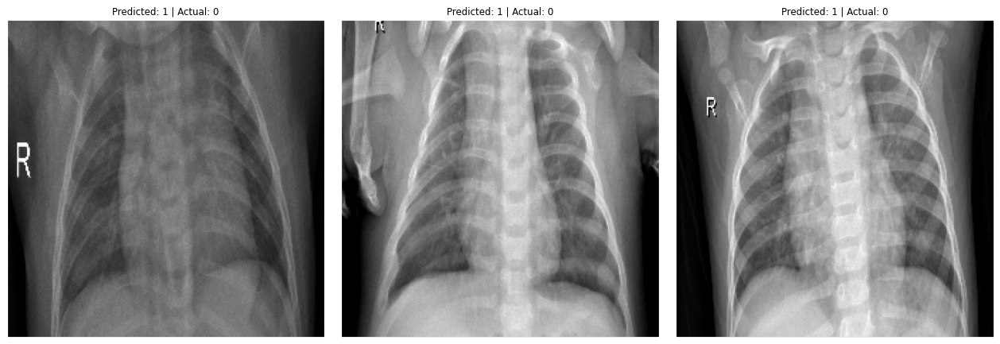

In [84]:
# display incorrect predictions

# Crear una figura para todas las subtramas
plt.figure(figsize=(15, 5), dpi=85)

# Mostrar las primeras 3 predicciones incorrectas en una sola fila
for i, a in enumerate(incorrect_predictions[:3]):
    ax = plt.subplot(1, 3, i + 1)
    ax.imshow(test_data[a].reshape(224, 224, 3))
    ax.set_title(f"Predicted: {predictions[a]} | Actual: {test_labels[a]}", fontsize=10)
    ax.set_xticks([]), ax.set_yticks([])  # Eliminar ejes

plt.tight_layout()
plt.show()

# Conclusiones

En el transcurso de esta investigación, hemos logrado avances significativos en la detección de neumonía utilizando técnicas de Deep Learning. Nuestros hallazgos indican que el modelo **ResNet50V2**, en particular, muestra una notable capacidad para predecir casos de neumonía con alta precisión. Este éxito se atribuye a la arquitectura avanzada de ResNet50V2, que es capaz de capturar patrones complejos y características sutiles en las imágenes radiográficas.

Además, se ha realizado una evaluación exhaustiva utilizando otras arquitecturas de redes neuronales, incluyendo modelos CNN genéricos y la arquitectura VGG16. Aunque estos modelos también han demostrado ser efectivos, ResNet50V2 se destaca por su rendimiento superior en términos de precisión y capacidad de generalización.

Estos resultados subrayan la importancia de elegir la arquitectura adecuada y las estrategias de entrenamiento en la resolución de problemas específicos de clasificación de imágenes médicas. La aplicación de modelos como ResNet50V2 en el campo de la radiología promete no solo mejorar la precisión diagnóstica, sino también ofrecer herramientas de apoyo esenciales para los profesionales médicos en su labor diaria.

---

*El trabajo presentado aquí abre caminos para futuras investigaciones, donde se podrían explorar combinaciones de diferentes arquitecturas y técnicas de aprendizaje profundo para mejorar aún más la detección y clasificación de diversas condiciones médicas a través del análisis de imágenes.*


# Referencias para imágenes y animaciones

https://medium.datadriveninvestor.com/convolutional-neural-networks-3b241a5da51e

https://www.computer.org/csdl/journal/si/2020/04/08957307/1ilQS7GE9MY

https://towardsdatascience.com/what-is-transposed-convolutional-layer-40e5e6e31c11

https://nico-curti.github.io/NumPyNet/NumPyNet/layers/maxpool_layer.html

https://towardsdatascience.com/a-comprehensive-guide-to-convolutional-neural-networks-the-eli5-way-3bd2b1164a53
